
# Intelligent Navigation System: Leveraging Dijkstra, A* Search Algorithms, and Reinforcement Learning for Traffic-Aware Shortest and Most Efficient Pathfinding in Real-World Scenarios



# Introduction

The aim is to develop a navigation system capable of finding the shortest path between a starting point and destination. It integrates uninformed and informed search algorithms for pathfinding and reinforcement learning to address real-world challenges such as traffic congestion, road closures, one-way roads, etc. The system is designed to use as little real-world data as possible, simulating a scenario where a person has only a map and basic coordinate tools to find their path, with no access to advanced map tools. The goal is to find both the shortest and the most efficient route by dynamically adapting to real-time traffic issues and road blockades.

The algorithms utilized are:
1. Dijkstra uninformed search algorithm
2. A* informed search algorithm
3. Q-learning Reinforcement learning algorithms to dynamically adapts to real-time, real-world traffic issues and reroute accordingly.

The project includes a comparative analysis of all the algorithms to identify the most optimal one based on all the given constraints.

To manage computational complexity, the map and its graph model will be limited to a 2100-meter radius around the center of Middlesbrough, England.

_**Disclaimer:** This system is developed for educational purposes only and may not reflect the accuracy or reliability required for real-world navigation._

_**N.B.** If you're running this locally, please refer to the requirements.txt file for a comprehensive list of Python libraries and packages utilized in this project, along with their respective versions._


In [1]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

from IPython.core.display_functions import clear_output

# Fundamental python libraries
import numpy as np
import pandas as pd

# For high quality visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
px.set_mapbox_access_token('Your_Plotly_Express_API_Key')
import gmplot

# maps
import googlemaps
import polyline

# Model maps as graphs with nodes and edges
import osmnx as ox
import networkx as nx

# To create custom RL environment
import gymnasium as gym
from gymnasium import spaces

# For API calls
import requests

# For geocoding and distance calculations
import geopy
import pygeodesy
from geopy.distance import geodesic

# For A* search algorithm implementation
import heapq

from datetime import datetime
import requests
import random


# Creating a graph model of the location

Using osmnx package to download the road network with _'network_type'_ set to _'drive'_. This retrieves streets network for driving only.
Two-way streets are bidirectional by default. One-way streets are directed which means travel is allowed only in the direction of the street's design.


In [2]:
# Set the place
PLACE = 'Middlesbrough, England'

# Set the radius (in meters).
RADIUS = 2100

# Download the road network
G = ox.graph_from_address(PLACE, dist=RADIUS, network_type='drive')

# Add road speeds in kilometers per hour and travel time in seconds
G = ox.add_edge_travel_times(ox.add_edge_speeds(G))

In [3]:
# Display number of nodes in the graph
print(f'There are {len(G)} nodes')

# Display the first 5 edges and their attributes.
# An edge simply connects two nodes, think of it as a travel path between two points
print(f'The first 5 edges are {list(G.edges(keys=True, data=True))[:5]}')

There are 1772 nodes
The first 5 edges are [(2742529, 694291381, 0, {'osmid': 41401939, 'highway': 'secondary', 'lanes': '2', 'maxspeed': '30 mph', 'name': 'Stockton Road', 'ref': 'B6541', 'oneway': False, 'reversed': True, 'length': 56.72560010041624, 'speed_kph': 48.2802, 'travel_time': 4.229728964699783}), (2742529, 694291279, 0, {'osmid': 55248227, 'highway': 'residential', 'name': 'Corder Road', 'oneway': False, 'reversed': False, 'length': 67.00839597513664, 'speed_kph': 40.1234220246238, 'travel_time': 6.012204675923419}), (2742529, 583502147, 0, {'osmid': 41401939, 'highway': 'secondary', 'lanes': '2', 'maxspeed': '30 mph', 'name': 'Stockton Road', 'ref': 'B6541', 'oneway': False, 'reversed': False, 'length': 175.2697499524967, 'geometry': <LINESTRING (-1.262 54.568, -1.261 54.568, -1.261 54.568, -1.26 54.568, -1.2...>, 'speed_kph': 48.2802, 'travel_time': 13.068941301589227}), (7630514, 600748422, 0, {'osmid': 4020789, 'highway': 'secondary', 'maxspeed': '30 mph', 'name': 'Lin


The information above provides detailed data for each travel path (edges) between nodes, including the highway type, road name, length (in meters), speed limits (in both mph and kph), and travel time (in seconds).


In [4]:
# Display information of the first 5 nodes
print(f'{list(G.nodes(data=True))[:5]}')

[(2742529, {'y': 54.5675608, 'x': -1.262172, 'street_count': 3}), (7630514, {'y': 54.5675702, 'x': -1.2398263, 'street_count': 4}), (7630515, {'y': 54.5689969, 'x': -1.2392771, 'street_count': 3}), (7630516, {'y': 54.5707834, 'x': -1.2385956, 'highway': 'traffic_signals', 'street_count': 4}), (7630517, {'y': 54.5717886, 'x': -1.2382137, 'street_count': 3})]


In [5]:
# Display information of the last 5 nodes
print(f'{list(G.nodes(data=True))[-5:]}')

[(12288345875, {'y': 54.5810099, 'x': -1.233393, 'street_count': 3}), (12290644705, {'y': 54.5738564, 'x': -1.2027365, 'street_count': 4}), (12290644707, {'y': 54.573893, 'x': -1.2029605, 'street_count': 4}), (12290644708, {'y': 54.5739794, 'x': -1.2035017, 'street_count': 2}), (12439709176, {'y': 54.5795401, 'x': -1.2339887, 'street_count': 3})]



Nodes represent coordinates, latitude and longitude.


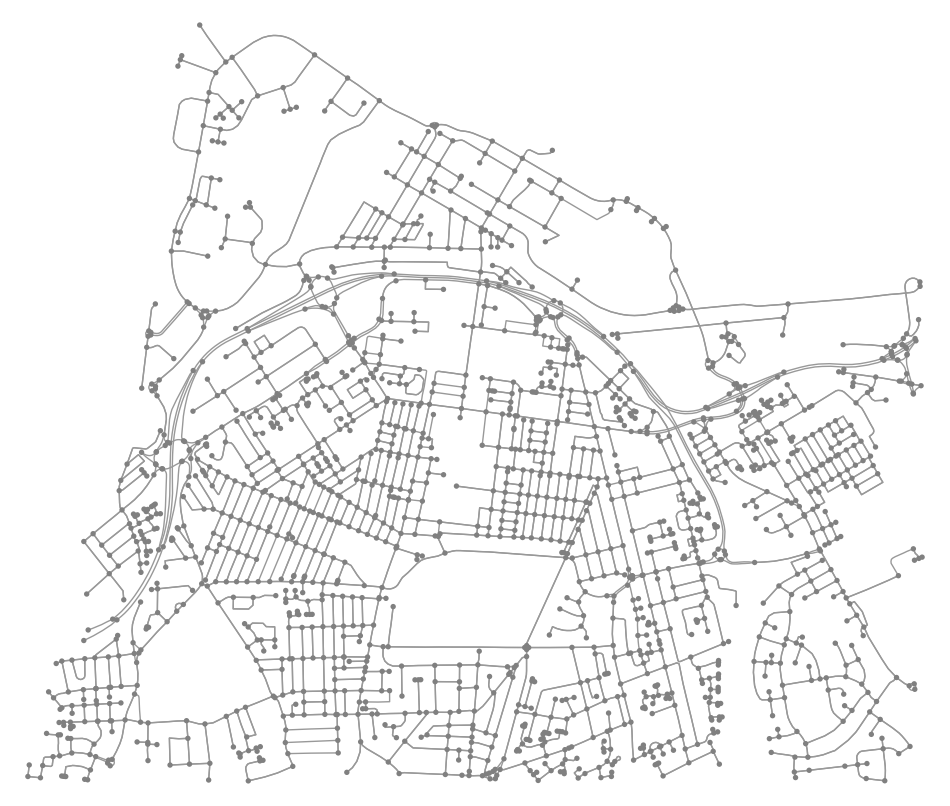

In [6]:
# Displaying the graph model of the location
ox.plot_graph(G, node_color="grey", bgcolor='#ffffff', figsize=(12, 12))
plt.show()

In [7]:
# Displaying names of some streets
for u, v, key, data in list(G.edges(keys=True, data=True))[:5]:
    if data.get('name') is not None:
        print(f'{data.get("name")}')

Stockton Road
Corder Road
Stockton Road
Linthorpe Road
Linthorpe Road


In [8]:
# Select the last and first nodes to use as origin and destination
node_to_index = {node_id: idx for idx, node_id in enumerate(G.nodes)}
origin = list(G.nodes(data=True))[node_to_index[12290644708]] # 12290644708 707088775
destination = list(G.nodes(data=True))[node_to_index[2742529]] # 2742529 368934261
print(origin)
print(destination)

(12290644708, {'y': 54.5739794, 'x': -1.2035017, 'street_count': 2})
(2742529, {'y': 54.5675608, 'x': -1.262172, 'street_count': 3})


In [9]:
# Display the addresses of the randomly selected origin and destination
origin_coordinates = (origin[1]['y'], origin[1]['x'])
destination_coordinates = (destination[1]['y'], destination[1]['x'])

origin_address = geopy.geocoders.Nominatim(user_agent='geoapi').reverse(origin_coordinates)
destination_address = geopy.geocoders.Nominatim(user_agent='geoapi').reverse(destination_coordinates)

print(f'The origin address is {origin_address}')
print(f'The destination address is {destination_address}')

The origin address is South Bank Road, Lawson Industrial Estate, Berwick Hills, Middlesbrough, Tees Valley, England, TS3 6QL, United Kingdom
The destination address is Stockton Road, Ayresome, Middlesbrough, Tees Valley, England, TS5 4AJ, United Kingdom


## Functions

In [10]:
def get_coordinates(graph, path):
    """Get coordinates of each node in a list"""
    coordinates = []
    graph_nodes = list(graph.nodes(data=True))
    for num in path:
        for n, details in graph_nodes:
            if num == n:
                coordinates.append((details['y'], details['x']))
                break
    return coordinates

def get_google_map_details(start_coordinates, dest_coordinates):
    """ Get google map direction details for origin and destination"""
    # Initialize Google Maps client
    api_key = 'Your_Google_Maps_API_key'
    gmaps = googlemaps.Client(key=api_key)

    # Define start and end locations
    ori = start_coordinates
    dest = dest_coordinates

    # Get directions between the origin and destination
    return gmaps.directions(ori, dest, mode='driving', departure_time=datetime.now(), alternatives=True)

def get_osm_map_details(start_coordinates, dest_coordinates):
    """ Get OSM direction details for origin and destination"""
    # Define start and end locations (lat, lon)
    origin_lat, origin_lon = start_coordinates
    dest_lat, dest_lon = dest_coordinates

    # OSRM API endpoint for driving directions
    osrm_api_url = 'http://router.project-osrm.org/route/v1/driving/'

    # API URL for the route request
    route_url = f"{osrm_api_url}{origin_lon},{origin_lat};{dest_lon},{dest_lat}?overview=full&geometries=geojson"

    # Get the route data from OSRM API
    return requests.get(route_url).json()

def get_osm_routes(direction_data):
    """Get coordinates for OSM map direction data"""
    coordinates = []
    for lon, lat in direction_data['routes'][0]['geometry']['coordinates']:
        coordinates.append((lat, lon))
    return coordinates

def get_google_coordinates(google_direction_data):
    """ Get coordinates for google maps direction data"""
    coordinates = []
    for leg in google_direction_data[1]['legs']:
        for step in leg['steps']:
            start_location = step['start_location']
            coordinates.append((start_location['lat'], start_location['lng']))

        # Ensure the end location is included
        end_location = leg['steps'][-1]['end_location']
        coordinates.append((end_location['lat'], end_location['lng']))

    return coordinates

def plot_maps(coordinates, alternate_route=None, title='Travel Path'):
    """Plot maps coordinates"""
    fig = px.scatter_mapbox(
        lon=[v for u, v in coordinates],
        lat=[u for u, v in coordinates],
        zoom=12.5,
        width=800,
        height=600,
        animation_frame=list(range(0, len(coordinates))),
        title=title,
        mapbox_style="streets"
    )
    fig.data[0].marker = dict(size=12, color='black')
    

    # Adding the start point
    fig.add_trace(px.scatter_mapbox(
        lon=[coordinates[0][1]],
        lat=[coordinates[0][0]]
    ).data[0])
    fig.data[1].marker = dict(size=15, color='green')

    # Adding the end point
    fig.add_trace(px.scatter_mapbox(
        lon=[coordinates[-1][1]],
        lat=[coordinates[-1][0]]
    ).data[0])
    fig.data[2].marker = dict(size=15, color='red')

    # Adding the line for the route
    fig.add_trace(px.line_mapbox(
        lon=[v for u, v in coordinates],
        lat=[u for u, v in coordinates]
    ).data[0])
    

    if alternate_route:
        fig.data[3].line = dict(color="red", width=2)
        # Adding the alternate route
        fig.add_trace(px.line_mapbox(
            lon=[v for u, v in alternate_route], 
            lat=[u for u, v in alternate_route]
        ).data[0])
        fig.data[-1].line = dict(color="blue", width=2)
    return fig

def compute_weight(graph, path, weight):
    """Computes the total specified weight for a given set of nodes."""
    total = 0.0

    for i in range(len(path) - 1):
        current_node = path[i]
        next_node = path[i + 1]
        # Add the 'length' of the edge between current_node and next_node
        total += graph[current_node][next_node][0].get(weight, 0)

    return total

def show_plots(r=None, t=None, c=None, o=None, d=None, default=None):
    # Show route, traffic and road closure nodes
    
    # routes, traffic nodes, and road closure nodes
    routes = r
    traffic_nodes = t
    road_closure_nodes = c
    origin = o
    dest = d
    
    # Plot the graph
    fig, ax = ox.plot_graph(
        G,
        show=False,
        close=False,
        bgcolor='#ffffff',
        node_color='grey',
        figsize=(12, 12)
    )

    if routes is not None:
        # Highlight the route in blue
        ox.plot_graph_route(
            G,
            routes,
            route_linewidth=4,
            route_color='blue',
            route_alpha=0.7,
            node_color='none',
            ax=ax,
            show=False,
            close=False
        )

    if default:
        ox.plot_graph_route(
            G, 
            default, 
            route_linewidth=2, 
            route_color='red', 
            route_alpha=0.3, 
            node_color='none',
            ax=ax, 
            show=False, 
            close=False
        )
        
    if traffic_nodes:
        # Highlight traffic nodes in yellow
        nx.draw_networkx_nodes(
            G,
            pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)),
            nodelist=traffic_nodes,
            node_color='yellow',
            node_size=50,
            ax=ax
        )
    
    if road_closure_nodes:
        # Highlight road closure nodes in red
        nx.draw_networkx_nodes(
            G,
            pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)),
            nodelist=road_closure_nodes,
            node_color='red',
            node_size=50,
            ax=ax
        )

    if origin:
        # Highlight Origin node in green
        nx.draw_networkx_nodes(
            G,
            pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)),
            nodelist=origin,
            node_color='green',
            node_size=50,
            ax=ax
        )

    if dest:
        # Highlight destination node in purple
        nx.draw_networkx_nodes(
            G,
            pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)),
            nodelist=dest,
            node_color='purple',
            node_size=50,
            ax=ax
        )
    
    # Show the plot
    plt.show()


# Dijkstra Uninformed Search Algorithm

Using Dijkstra's uninformed search algorithm to compute the shortest path between nodes in a weighted graph.
The graph model of the map is a multidimensional-weighted graph representing the road network with weights such as distance (in meters) and travel time (in seconds), making Dijkstra's algorithm a suitable choice.
The networkx library includes a built-in implementation of Dijkstra's algorithm, so there is no need to redefine it.


In [11]:
# Compute the shortest path using Dijkstra's uninformed search algorithm, with the weight set as the distance (in meters) between nodes.
route_by_length = nx.shortest_path(G, source=origin[0], target=destination[0], weight='length', method='dijkstra')

# Compute the distance of the shortest path in meters
route_distance = compute_weight(G, route_by_length, "length")
print(f'The shortest path distance is {route_distance:.2f} meters, which is {(route_distance/1000):.2f} kilometers.')

rl_travel_time = compute_weight(G, route_by_length, "travel_time")
print(f'The travel time is {rl_travel_time:.2f} seconds, which is {rl_travel_time/60:.2f} minutes')

The shortest path distance is 4472.93 meters, which is 4.47 kilometers.
The travel time is 313.04 seconds, which is 5.22 minutes


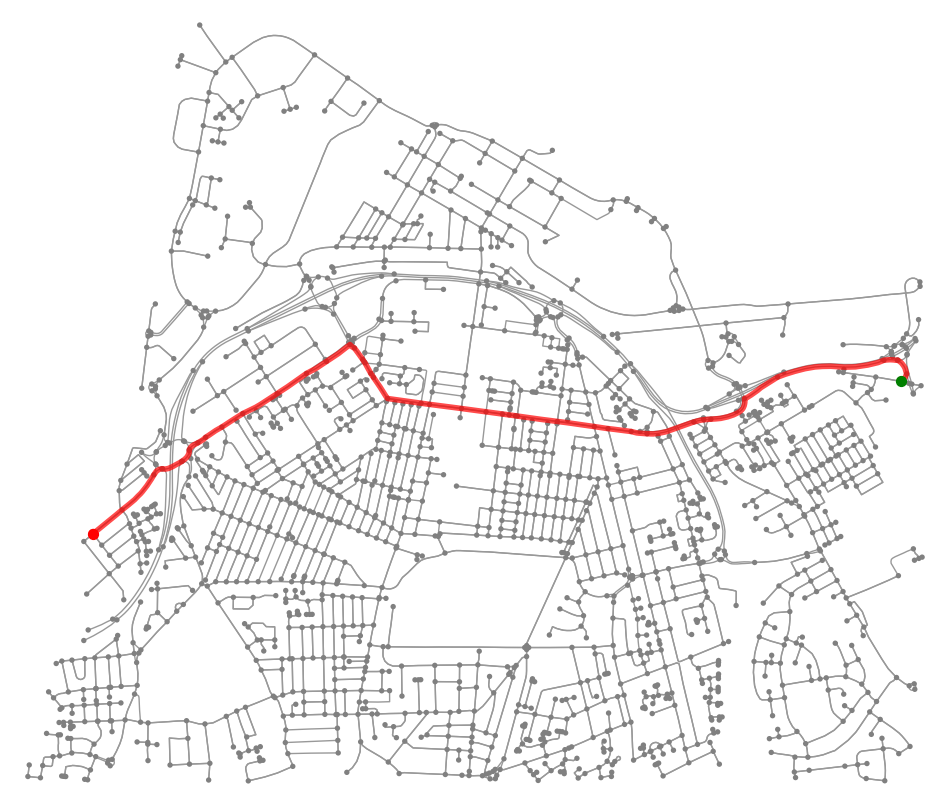

In [12]:
# Plot the network of Dijkstra's shortest path by distance
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=route_by_length, route_linewidth=4, route_color='red', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()

In [13]:
# Compute the shortest path using Dijkstra's uninformed search algorithm, with the weight set as the travel time (in seconds) between nodes.
route_by_time = nx.shortest_path(G, source=origin[0], target=destination[0], weight='travel_time', method='dijkstra')

# Compute the time of the shortest path in seconds
route_time = compute_weight(G, route_by_time, "travel_time")
print(f'The shortest path time is {route_time:.2f} seconds, which is {(route_time/60):.2f} minutes.')

tt_distance = compute_weight(G, route_by_time, "length")
print(f'The distance for this path is {tt_distance:.2f} meters, which is {tt_distance/1000:.2f} km.')

The shortest path time is 239.79 seconds, which is 4.00 minutes.
The distance for this path is 4818.40 meters, which is 4.82 km.


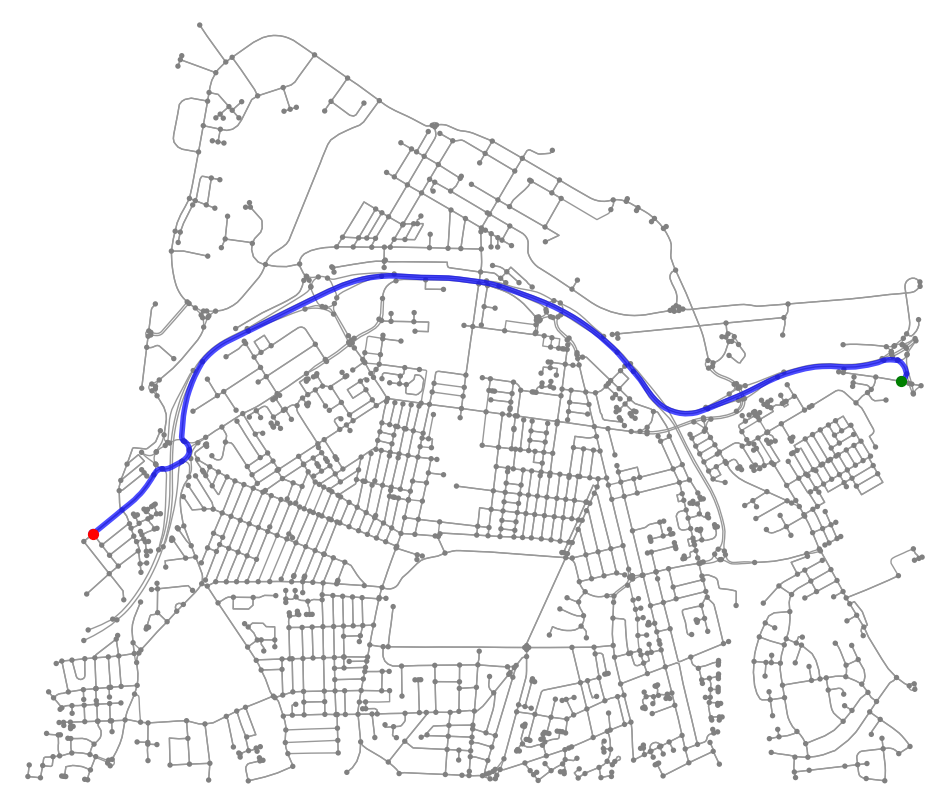

In [14]:
# Plot the network of Dijkstra's shortest path by time
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=route_by_time, route_linewidth=4, route_color='blue', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()

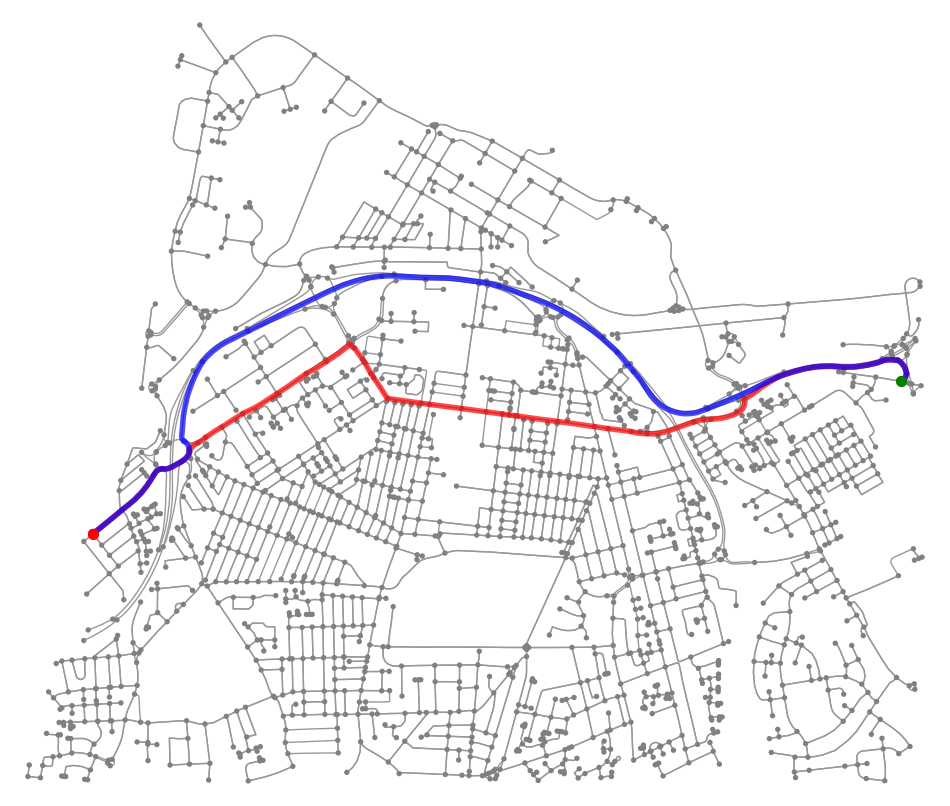

In [15]:
# View both routes on the same map network
# Red for Dijkstra's shortest route by distance and blue for Dijkstra's shortest route by time
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=route_by_length, route_linewidth=4, route_color='red', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
ox.plot_graph_route(G, route=route_by_time, route_linewidth=4, route_color='blue', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()


Both paths are different due to the fact that driving roads have varying speed limits. As a result, the shortest distance may not necessarily be the fastest route while driving, hence the difference.
Dijkstra's search algorithm respects directed edges when computing the shortest path. This means that it only considers edges in the direction they are defined in the graph, this is useful for one-way road.


In [16]:
# Get the coordinates of both shortest paths
# rl = route_by_length
# rt = route_by_time

coordinates_for_rl = get_coordinates(G, route_by_length)
coordinates_for_rt = get_coordinates(G, route_by_time)

In [17]:
# display OSM path for both routes
# blue polyline for weight = distance and purple polyline for weight = travel times
fig = plot_maps(coordinates_for_rl, alternate_route=coordinates_for_rt, title='Dijkstra search algorithm')
fig.show()

In [18]:
# confirm results of Dijkstra's search algorithm with Google Maps data and OSM data
google_routes = get_google_map_details(coordinates_for_rl[0], coordinates_for_rl[-1])
# google_direction_coordinates = get_google_coordinates(google_routes)

osm_routes = get_osm_map_details(coordinates_for_rl[0], coordinates_for_rl[-1])
osm_direction_coordinates = get_osm_routes(osm_routes)

In [19]:
# Confirm with Google map data
print(f"The shortest path distance by google map is {google_routes[0]['legs'][0]['distance']['value']} meters, which is {google_routes[0]['legs'][0]['distance']['text']}")
print(f"The shortest path travel time by google map is {google_routes[0]['legs'][0]['duration']['value']} seconds, which is {google_routes[0]['legs'][0]['duration']['text']}")
print(f"Assuming an average speed of {(google_routes[0]['legs'][0]['distance']['value']/google_routes[0]['legs'][0]['duration']['value']):.2f} m/s or {(google_routes[0]['legs'][0]['distance']['value']/google_routes[0]['legs'][0]['duration']['value'])*3.6:.2f} km/s")

The shortest path distance by google map is 4850 meters, which is 4.8 km
The shortest path travel time by google map is 326 seconds, which is 5 mins
Assuming an average speed of 14.88 m/s or 53.56 km/s


In [20]:
# Confirm with Open street map data
print(f"The shortest path distance by Open street map is {osm_routes['routes'][0]['distance']} meters, which is {(osm_routes['routes'][0]['distance']/1000):.2f} km")
print(f"The shortest path travel time by Open street map is {osm_routes['routes'][0]['duration']} seconds, which is {osm_routes['routes'][0]['duration']/60:.2f} minutes")
print(f"Assuming an average speed of {(osm_routes['routes'][0]['distance']/osm_routes['routes'][0]['duration']):.2f} m/s or {(osm_routes['routes'][0]['distance']/osm_routes['routes'][0]['duration'])*3.6:.2f} km/s")

The shortest path distance by Open street map is 4831.4 meters, which is 4.83 km
The shortest path travel time by Open street map is 322.1 seconds, which is 5.37 minutes
Assuming an average speed of 15.00 m/s or 54.00 km/s


In [21]:
# display OSM path
# Click on the play button to see the path movement
fig = plot_maps(osm_direction_coordinates, title='OSM shortest path', )
fig.show()


The path generated by OSM may differ because it considers real-time factors such as traffic congestion, road closures, and other conditions.
However, in this case, Dijkstra's search algorithm, using travel time as the weight, returns the most optimal path as it aligns with live OpenStreetMap data and Google Maps data.



# A* Informed Search Algorithm

A* is an informed search algorithm that leverages heuristics to efficiently find the goal in weighted graphs with the lowest cost, such as the shortest distance or minimal travel time.
This makes A* an ideal solution for this problem.



## Define A* Algorithm

The graph represents a network model of a real-world location, where each node is associated with coordinates corresponding to a specific point on the map.
For more accurate results, the Haversine and Geodesic (WGS-84) formulas will be used to compute the heuristics.
The aim is to determine the shortest distance between two points along the Earth's surface, also known as the great-circle distance.


In [22]:
# Defining the heuristics

def get_coordinates_for_nodes(graph, nodes):
    """Helper function to get coordinates for multiple nodes"""
    return get_coordinates(graph, nodes)

def haversine_distance(graph, node, goal):
    """Computes the haversine distance(in meters) between two points"""
    start, end = get_coordinates_for_nodes(graph, [node, goal])
    return pygeodesy.haversine(start[0], start[1], end[0], end[1])

def geodesic_distance(graph, node, goal):
    """Computes the Geodesic distance(in meters) between two points"""
    start, end = get_coordinates_for_nodes(graph, [node, goal])
    return geodesic(start, end).meters

In [23]:
# A* algorithm implementation
class Node:
    def __init__(self, name, parent=None, g=0, h=0):
        self.name = name
        self.parent = parent  # To backtrack the path
        self.g = g  # Cost from start node
        self.h = h  # Heuristic cost to goal
        self.f = g + h  # Total cost

    def __lt__(self, other):
        # Less than operator to ensure priority queue sorts by f-value
        return self.f < other.f

def a_star(graph, start, goal, weight, heuristics=geodesic_distance):
    open_list = []
    closed_list = set()

    # Initialize start node and goal node
    start_node = Node(start, None, 0, heuristics(graph, start, goal))
    # goal_node = Node(goal, None, 0, 0)

    # Push the start node into the open list
    heapq.heappush(open_list, start_node)

    while open_list:
        # Get the node with the lowest f value
        current_node = heapq.heappop(open_list)
        closed_list.add(current_node.name)

        # If the goal is reached, backtrack to get the path
        if current_node.name == goal:
            path = []
            while current_node:
                path.append(current_node.name)
                current_node = current_node.parent
            return path[::-1]  # Return reversed path

        # Process each neighbor
        for neighbor in graph.neighbors(current_node.name):
            if neighbor in closed_list:
                continue  # Ignore already processed nodes

            # Calculate g, h, and f values
            g = current_node.g + graph[current_node.name][neighbor].get(weight, 0)  # Edge length as the cost
            h = heuristics(graph, neighbor, goal)  # Great-circle distance
            neighbor_node = Node(neighbor, current_node, g, h)

            # If neighbor is not in open list or we found a better path
            if all(neighbor_node.f < open_node.f for open_node in open_list if open_node.name == neighbor):
                heapq.heappush(open_list, neighbor_node)

    return []  # No path found


## Implementation
The travel time is the actual cost of moving along a road network, which is what the algorithm should use to evaluate the best path in terms of real-world travel.


In [24]:
# A* shortest path using travel time as cost and geodesic distance as heuristics function
a_star_geodesic_path = a_star(G, origin[0], destination[0], weight='travel_time', heuristics=geodesic_distance)

# Compute the travel time and distance for the shortest route by weight=travel_time and geodesic distance as heuristics function
# awt - A* weight travel time
awt_travel_time = compute_weight(G, a_star_geodesic_path, 'travel_time')
awt_distance = compute_weight(G, a_star_geodesic_path, 'length')
print(f'The distance for A* algorithm with weight as travel time is {awt_distance:.2f} meters, which is {awt_distance/1000:.2f} km')
print(f'The travel time for A* algorithm with weight as travel time is {awt_travel_time:.2f} seconds, which is {awt_travel_time/60:.2f} minutes')

The distance for A* algorithm with weight as travel time is 4818.40 meters, which is 4.82 km
The travel time for A* algorithm with weight as travel time is 239.79 seconds, which is 4.00 minutes


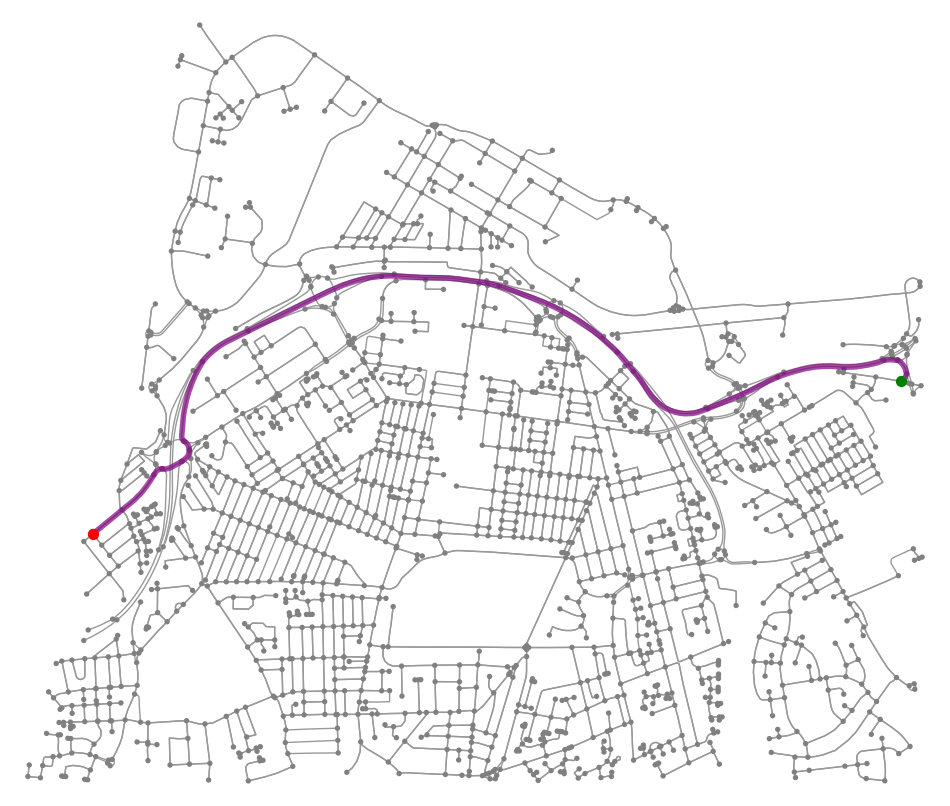

In [25]:
# Plot the network of A* shortest path with weight as travel time and geodesic distance as heuristics function
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=a_star_geodesic_path, route_linewidth=4, route_color='purple', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()


The true cost of traversing a road is typically time, not distance, because the speed at which a vehicle can travel along a road depends on factors such as speed limits, road type, and traffic conditions.

Computing the shortest path with the travel time as cost and the haversine distance as the heuristic function


In [26]:
# A* shortest path using travel time as cost function and haversine distance as heuristics
a_star_haversine_path = a_star(G, origin[0], destination[0], weight='travel_time', heuristics=haversine_distance)
# Compute the travel time and distance for the shortest route by haversine distance
# awd - A* weight distance
awd_travel_time = compute_weight(G, a_star_haversine_path, 'travel_time')
awd_distance = compute_weight(G, a_star_haversine_path, 'length')
print(f'The distance for A* algorithm with weight as distance is {awd_distance:.2f} meters, which is {(awd_distance/1000):.2f} km')
print(f'The travel time for A* algorithm with weight as distance is {awd_travel_time:.2f} seconds, which is {(awd_travel_time/60):.2f} minutes')

The distance for A* algorithm with weight as distance is 4818.40 meters, which is 4.82 km
The travel time for A* algorithm with weight as distance is 239.79 seconds, which is 4.00 minutes


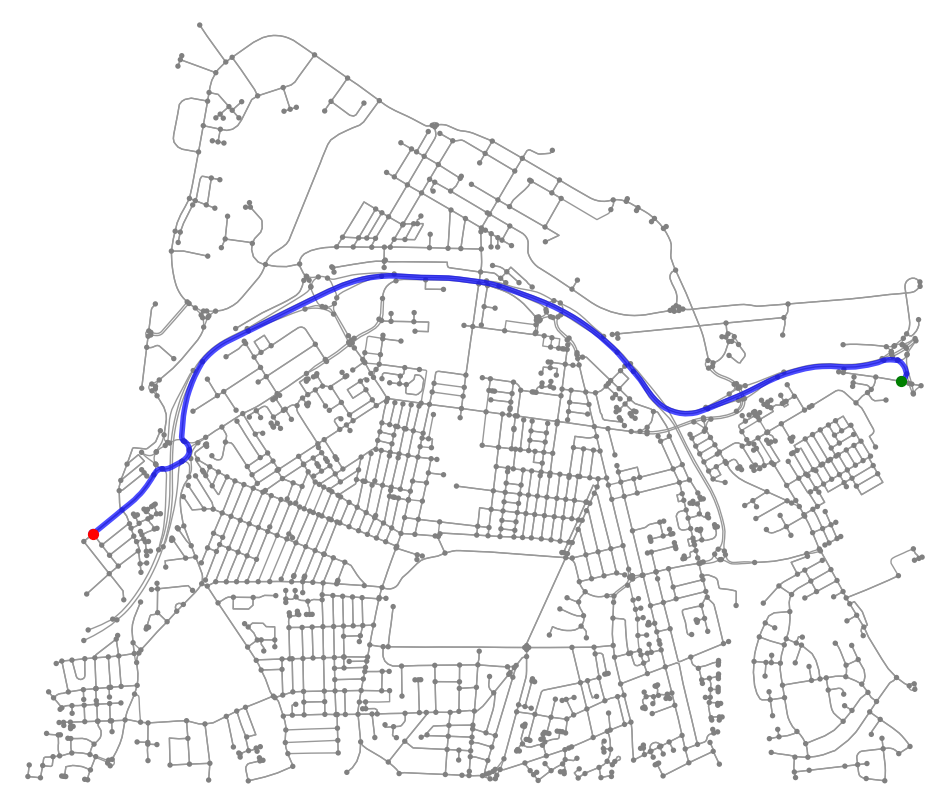

In [27]:
# Plot the network of A* shortest path with weight as travel time and haversine distance as heuristics
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=a_star_haversine_path, route_linewidth=4, route_color='blue', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()

In [28]:
# Get the coordinates of the A* algorithm shortest path by travel time
coordinates_for_a_star = get_coordinates(G, a_star_geodesic_path)

In [29]:
# display OSM path
fig = plot_maps(coordinates_for_a_star, title='A* informed search algorithm with weight as travel time')
fig.show()


# Reinforcement Learning

Using reinforcement learning with sensitivity to real-world scenarios to develop an agent that finds the optimal route by avoiding real-time traffic, road closures, etc.
The agent will explore the environment and learn from each interaction to determine the optimal route without any cost function or heuristics.
Guided just by the consequences of each action and total time steps.



## Create Environment

Gymnasium package is used to create the custom environment.
The environment is based on the graph network model of the location rendered by OSMnx.



### Environment Class


In [30]:
class MiddlesbroughEnv(gym.Env):
    def __init__(self, graph, start_node, goal_node, traffic=False, closure=False, step_size=1):
        super(MiddlesbroughEnv, self).__init__()

        # set the graph
        self.graph = graph

        # Max number of neighbor for any node, to be used to initialize the agent's Qtable
        self.max_neighbor = self._unique_neighbor_count(self.graph)

        # Step size for moving
        self.step_size = step_size

        # Get nodes and edges
        self.nodes = list(self.graph.nodes)
        self.edges = list(self.graph.edges)

        # Map node IDs to sequential indices (useful for the Qlearning matrix)
        self.node_to_index = {node_id: idx for idx, node_id in enumerate(self.nodes)}
        self.index_to_node = {idx: node_id for idx, node_id in enumerate(self.nodes)}

        # Set the start and goal node
        self.start_node = start_node
        self.goal_node = goal_node

        # Initialize agent position
        self.current_node = self.start_node

        # Visited nodes
        self.visited_nodes = [self.current_node]

        self.traffic = traffic
        self.closure = closure

        # initialize traffic nodes and closure nodes
        self.traffic_nodes = []
        self.closure_nodes = []

        #if self.traffic is True or self.closure is True:
            # if traffic is true or closure is true, guess the shortest path the agent may follow
            # set a traffic node or a road closure node.
            # road closure nodes will be considered dead end, thus there will be no neighbor nodes
            #self.guess_path = nx.shortest_path(G, source=self.start_node, target=self.goal_node, weight='travel_time', method='dijkstra')

        if self.traffic is True:
            # self.traffic_nodes.append(self.guess_path[random.randint(1, len(self.guess_path)-2)])  # avoid goal and target nodes
            self.traffic_nodes = [709985083]  # random placement

        if self.closure is True:
            # self.closure_nodes.append(self.guess_path[random.randint(1, len(self.guess_path)-2)])  # avoid goal and target nodes
            self.closure_nodes = [414083608]  # random placement

        # Calculate neighbors of the start node
        start_neighbors = self._get_neighbors(self.start_node)

        # Initialize dynamic action space with the size of the start node's neighbors
        self.action_space = spaces.Discrete(len(start_neighbors))

        # Observation space: number of nodes in the graph
        self.observation_space = spaces.Discrete(len(self.nodes))

    def _unique_neighbor_count(self, graph):
        """Get the highest neighbor count"""
        unique_neighbors_count = {node: len(list(graph.neighbors(node))) for node in graph.nodes()}
        max_neighbors_node = max(unique_neighbors_count, key=unique_neighbors_count.get)
        max_neighbors_count = unique_neighbors_count[max_neighbors_node]
        return max_neighbors_count

    def _get_neighbors(self, node):
        """Get all valid neighbors of the current node."""
        valid_neighbors = []
        # road closures are treated as dead end, so check if the current node is a closed road
        if self.closure and node in self.closure_nodes:
            return valid_neighbors
        neighbors = list(self.graph.neighbors(node))
        for neighbor in neighbors:
            # Make sure the parent node is not included in the neighbors
            if neighbor not in self.visited_nodes:
                valid_neighbors.append(neighbor)
        return valid_neighbors

    def _update_action_space(self):
        """Update the action space based on the number of neighbors."""
        neighbors = self._get_neighbors(self.current_node)
        self.action_space = spaces.Discrete(len(neighbors))  # Dynamic size based on neighbors

    def _map_action_to_neighbor(self, action, neighbors):
        """Map the action to a neighbor node."""
        if action < len(neighbors):
            return neighbors[action]
        return None  # Invalid action

    def step(self, action):
        """Take an action and update the environment."""

        # for each step
        reward = -1

        # Get all neighbors
        neighbors = self._get_neighbors(self.current_node)

        # Map the action to a neighbor
        next_node = self._map_action_to_neighbor(action, neighbors)

        if next_node is None:
            # Invalid action: no neighbor mapped to this action
            reward += -10 # penalty
            done = True
            return np.array(self.node_to_index[self.current_node], dtype=np.int32), reward, done, {}

        # Get previous node
        parent_node = self.current_node
        
        # Move to the next node
        self.current_node = next_node

        # Update visited nodes for visualization
        self.visited_nodes.append(self.current_node)

        # Check if the agent has reached the destination
        done = self.current_node == self.goal_node
        if done:
            reward += 100  # Big reward for reaching the destination
            return np.array(self.node_to_index[self.current_node], dtype=np.int32), reward, done, {}
        
        if self._get_neighbors(self.current_node):
            # Update the action space for the current node
            self._update_action_space()
        else:
            # Dead end, no neighbors
            reward += -10 # penalty
            done = True
            return np.array(self.node_to_index[self.current_node], dtype=np.int32), reward, done, {}

        # Check for traffic
        if self.traffic:
            if self.current_node in self.traffic_nodes:
                # Check if alternative routes are available
                alternative_neighbors = [neighbor for neighbor in self._get_neighbors(parent_node) if neighbor not in self.traffic_nodes]
                if alternative_neighbors:
                    # penalty if there are alternative routes
                    reward += -5
                    done = True  # Force agent to try alternative routes
                    return np.array(self.node_to_index[self.current_node], dtype=np.int32), reward, done, {}
                else:
                    # If no alternative, assume waiting for congestion to clear
                    reward += -5

        # Return the state (mapped index), reward, and done status
        return np.array(self.node_to_index[self.current_node], dtype=np.int32), reward, done, {}

    def reset(self):
        """Reset the environment."""
        self.current_node = self.start_node
        self.visited_nodes = [self.current_node]
        self._update_action_space()
        return np.array(self.node_to_index[self.current_node], dtype=np.int32)

    def render(self, mode='human'):
        """Render the current position."""
        print(f"Current Node: {self.current_node}, Latitude: {self.graph.nodes[self.current_node]['y']}, Longitude: {self.graph.nodes[self.current_node]['x']}")
        print(f"Visited Nodes: {self.visited_nodes}")



### Environment information

The environment is a graph model of all roads in a real-world location, with each point on a road represented as a node.
It is designed so that once a node is visited, it cannot be revisited. In essence, a node cannot return to its parent node.
This approach is suitable because the goal is to find the optimal path, which is achieved by reducing computational complexity.
There are no heuristics guiding the agent to its destination; it must explore its environment to determine the path.

The reward is designed as follows
- +100 points for reaching its destination
- -1 for each time step
- -10 for reaching a dead end, that is a node without any other nodes except its parent node or for road closure nodes
- -10 for an illegal action that does not map to node, there by making the next node none
- -5 for traffic congestion

The environment has a dynamic action space, meaning the actions change depending on each node(state) visited.
This is because different nodes (states) have a different number of direct neighbors.
This design keeps the actions within the scope of the neighbors of the current node (state) to avoid choosing an action that is out of bound.

In [31]:
# Initialize the environment
env = MiddlesbroughEnv(G, origin[0], destination[0])

# render the environment
env.render()

Current Node: 12290644708, Latitude: 54.5739794, Longitude: -1.2035017
Visited Nodes: [12290644708]


In [32]:
# View the action space for the origin node
print(f'Action space {env.action_space}')

Action space Discrete(2)


In [33]:
# we confirm that by checking the direct neighbors of the current node
print(list(G.neighbors(env.current_node)))

[1817945870, 12290644707]



The action space is 2 because the agent can only move to one of 2 nodes from its current location


In [34]:
# View the observation space - in this case, the observation or states are the different nodes
print(f'Observation space {env.observation_space}')

Observation space Discrete(1772)


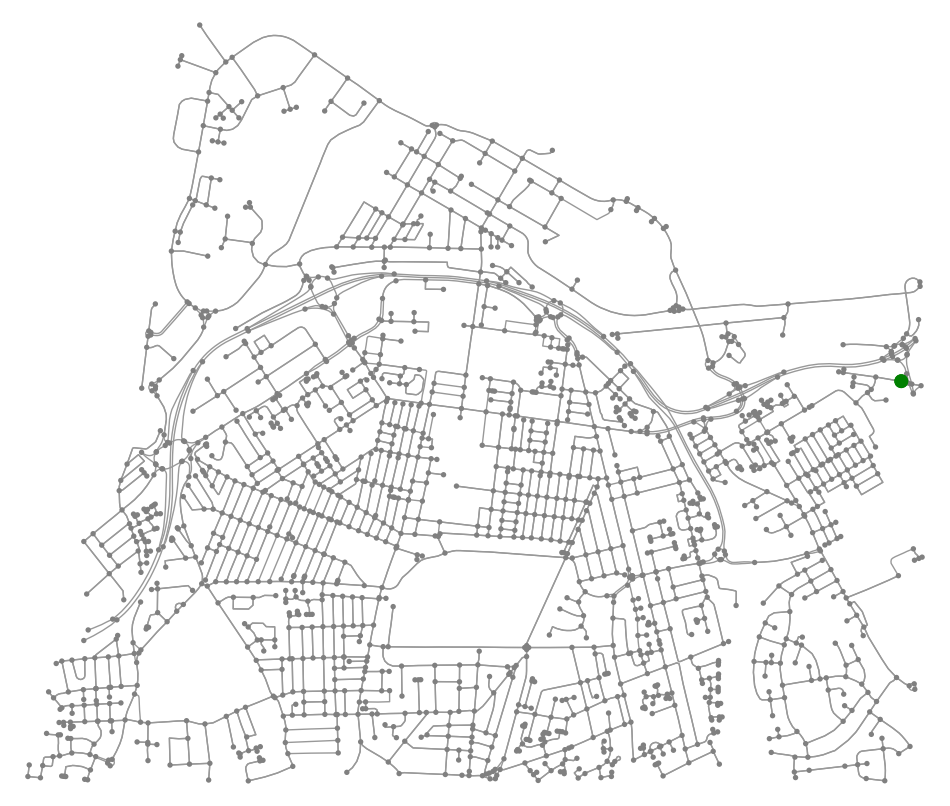

(<Figure size 1200x1200 with 1 Axes>, <Axes: >)

In [35]:
# Plot the network of A* shortest path with weight as travel time
ox.plot_graph_route(G, route=env.visited_nodes, route_color='green', route_linewidth=4, route_alpha=1, orig_dest_size=100, node_color='grey', bgcolor='#ffffff', figsize=(12, 12))


The figure above show the agents start location which is a point on the map represented by a red dot.



## Create the Agent

Using Q-learning RL Algorithm to create an agent for the environment.



### Agent Class


In [36]:
class QLearningAgent:
    def __init__(self, environment, learning_rate=0.1, discount_factor=0.9, epsilon=0.1):
        self.env = environment
        self.learning_rate = learning_rate
        self.discount_factor = discount_factor
        self.epsilon = epsilon
        # learning_rate=0.1, discount_factor=0.9, epsilon=1, min_epsilon=0.1, decay_rate=0.995
        # self.min_epsilon = min_epsilon
        # self.decay_rate = decay_rate

        # Initialize Q-table with zeros (number of states * max number of actions, which is the max neighbor overall)
        self.q_table = np.zeros((self.env.observation_space.n, self.env.max_neighbor))

    def choose_action(self, state):
        """Choose action using epsilon-greedy policy."""
        if random.uniform(0, 1) < self.epsilon:
            return self.env.action_space.sample()  # Explore: random action
        else:
            n = env.action_space.n  # make sure we don't go out of bound
            return np.argmax(self.q_table[state][:n])  # Exploit: best action based on Q-table

    def update_q_table(self, state, action, reward, next_state, done):
        """Update Q-table using the Q-learning formula."""
        old_q_value = self.q_table[state, action]
        future_q_value = np.max(self.q_table[next_state])
        self.q_table[state, action] = (1 - self.learning_rate) * old_q_value + self.learning_rate * (reward + self.discount_factor * future_q_value)

    def train(self, num_episodes=100000, display=False):
        """Train the agent using Q-learning."""
        total_episode_reward = 0
        highest_reward = 0
        time_steps = 0
        for episode in range(num_episodes):
            state = self.env.reset()
            done = False
            total_reward = 0
            while not done:
                action = self.choose_action(state)
                next_state, reward, done, _ = self.env.step(action)
                self.update_q_table(state, action, reward, next_state, done)
                state = next_state
                total_reward += reward

                time_steps += 1

            # Decay exploration rate
            # self.epsilon = max(self.min_epsilon, self.epsilon * self.decay_rate)

            if display:
                if episode % 100 == 0:
                    clear_output(wait=True)
                    print(f"Episode {episode}, Total Reward: {total_reward}.")

            total_episode_reward += total_reward

            # compute the highest reward for the episodes
            if total_reward > highest_reward:
                highest_reward = total_reward

        print(f'Training complete for {num_episodes} steps with the highest reward of {highest_reward} and average reward of {total_episode_reward/num_episodes} and average timestep of {time_steps/num_episodes}.')


    def test(self, num_episodes=100, hyperparameter=False):
        """Test the agent's performance"""
        penalties = 0
        total_episode_reward = 0
        time_steps = 0
        for episode in range(num_episodes):
            state = self.env.reset()
            done = False
            total_reward = 0
            while not done:
                n = env.action_space.n
                # The agent does not explore but exploits learned information from the qtable
                action = np.argmax(self.q_table[state][:n])
                state, reward, done, _ = self.env.step(action)
                total_reward += reward

                # penalty for traffic(-5), dead ends and road closures(-10) and invalid actions(-10)
                # remember the -1 for each step
                if reward in [-6, -11]:
                    penalties += 1

                time_steps += 1

            total_episode_reward += total_reward

        if hyperparameter:
            return time_steps
        else:
            return penalties, total_episode_reward, time_steps, num_episodes

In [37]:
# Initialize Q-learning agent
agent = QLearningAgent(env)


### Train the agent

Train the agent with default agent parameters


In [38]:
# Train the agent for 100000 episodes for the best result
agent.train(num_episodes=100000, display=True)

Episode 99900, Total Reward: 76.
Training complete for 100000 steps with the highest reward of 76 and average reward of 40.55472 and average timestep of 24.54448.



### Evaluate the agent

Test the agent with the default agent parameters


In [39]:
# Show the q values for the initial state
agent.q_table[env.node_to_index[env.start_node]]

array([-0.33939745, -0.33939745,  0.        ,  0.        ])

In [40]:
#Test the agent's performance. No more exploration, only exploitation
rl_penalties, rl_total_reward, rl_timesteps, rl_epoch = agent.test(num_episodes=100)

# render the custom environment
env.render()

Current Node: 2742529, Latitude: 54.5675608, Longitude: -1.262172
Visited Nodes: [12290644708, 1817945870, 255404702, 9815513286, 3107441422, 1817945942, 7631102, 21477577, 21477568, 21477564, 21477540, 21477527, 414083608, 21477353, 7652369, 27698869, 27698859, 7652371, 7652373, 4545223289, 817174317, 27725106, 580910344, 583502147, 2742529]


In [41]:
# Compute the results
print(f'Agent results after {rl_epoch} episodes')
print(f'Average time steps per episode {rl_timesteps/rl_epoch}')
print(f'Average penalties per episode {rl_penalties/rl_epoch}')
print(f'Agent rewards per episode {rl_total_reward/rl_epoch}')

Agent results after 100 episodes
Average time steps per episode 24.0
Average penalties per episode 0.0
Agent rewards per episode 76.0



Each step incurs a penalty of -1, and with a total of 24 steps per episode, the total penalty is -24. Subtracting this from the goal of 100 results in a reward of 76.
The agent did not hit any dead ends or perform any out of bound actions


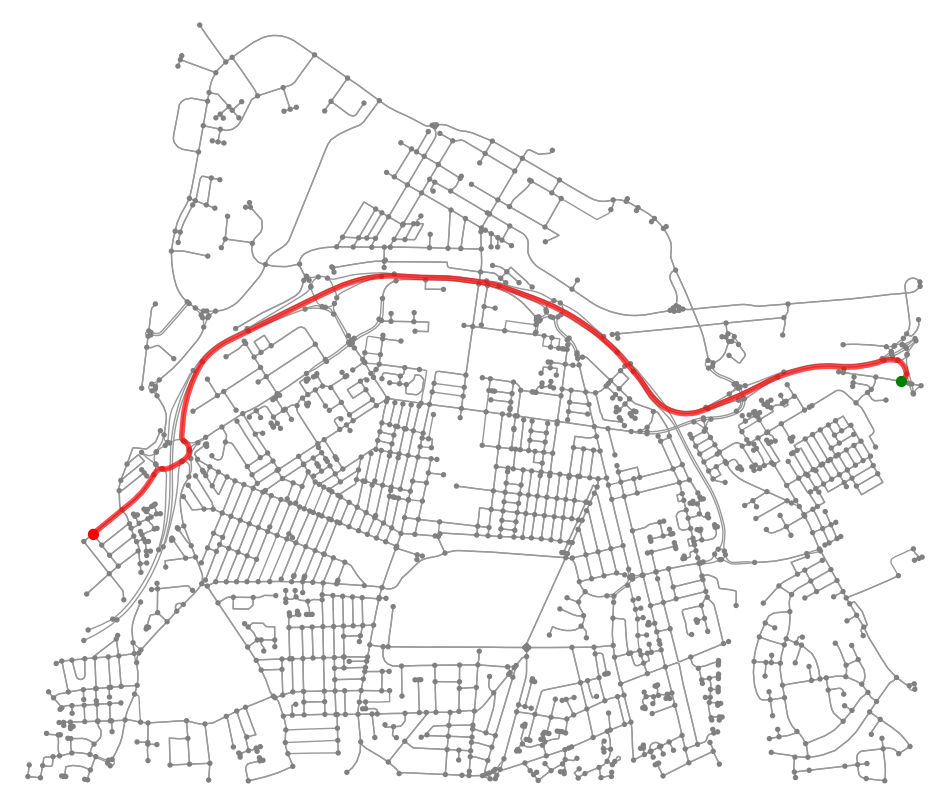

In [42]:
# Plot the agents best learned route
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=env.visited_nodes, route_linewidth=4, route_color='red', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()


### Hyperparameter tuning

The agent completes its objective, which is to find a path from the start to the destination.
Another goal is to find the optimal path while taking as few steps as possible.
The best hyperparameter for the agent would be the one that allows it to reach the destination with minimal steps.

Hyperparameters to tune are:
- Learning rate (alpha) with values [0.1, 0.3, 0.5, 0.7, 0.9]
- Discount function (gamma) with values [0.1, 0.3, 0.5, 0.7, 0.9]
- Epsilon (Balance between exploration and exploitation) with values [0.1, 0.3, 0.5, 0.7, 0.9]

The agent may not always find a path to the goal within the specified number of episodes.
To ensure it achieves its goal of finding a path to the destination, the reward for all completed episodes for each defined hyperparameter value must be a positive value before considering the time steps.
A high positive reward shows that the agent is able to find and learn a path throughout the episodes.

To manage computational complexity, the episodes will not exceed 10,000.



#### Learning Rate

The agent will be trained with the specified values for the learning rate parameter to find the value with the least time steps


In [43]:
# learning rate values
learning_rate = [0.1, 0.3, 0.5, 0.7, 0.9]
results = []
test_epoch = 10

for rate in learning_rate:
    # Initialize Q-learning agent
    agent = QLearningAgent(env, learning_rate=rate)  # keeping other hyperparameter values the same
    print(f'Training for Learning rate {rate}')
    agent.train(num_episodes=10000)
    steps = agent.test(num_episodes=test_epoch, hyperparameter=True)
    results.append(steps/test_epoch)

results

Training for Learning rate 0.1
Training complete for 10000 steps with the highest reward of 76 and average reward of -13.9499 and average timestep of 21.6379.
Training for Learning rate 0.3
Training complete for 10000 steps with the highest reward of 76 and average reward of 15.9439 and average timestep of 23.0061.
Training for Learning rate 0.5
Training complete for 10000 steps with the highest reward of 76 and average reward of 37.9163 and average timestep of 25.7287.
Training for Learning rate 0.7
Training complete for 10000 steps with the highest reward of 76 and average reward of 30.3534 and average timestep of 24.1176.
Training for Learning rate 0.9
Training complete for 10000 steps with the highest reward of 76 and average reward of 43.805 and average timestep of 24.911.


[24.0, 24.0, 24.0, 24.0, 24.0]


From the above, some episodes values have negative reward values.
Whilst there may be a path for episodes with negative rewards, a high positive reward is a certainty that a path was found and thus Only the time steps for values with high rewards will be considered


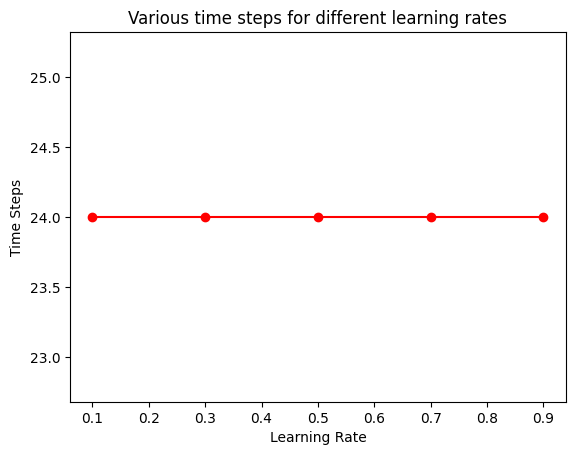

In [44]:
# Plot each learning rate against the time steps
plt.plot(learning_rate, results, marker='o', color='r')

# Labels
plt.xlabel('Learning Rate')
plt.ylabel('Time Steps')

# Title
plt.title("Various time steps for different learning rates")

plt.show()


All Learning rate yield the best result, 0.5 is selected.


In [45]:
best_learning_rate = 0.5


#### Discount Factor

The agent will be trained with the specified values for the discount factor parameter to find the value with the least time steps


In [46]:
# discount factor values
discount_factor = [0.1, 0.3, 0.5, 0.7, 0.9]
results = []
test_epoch = 10

for factor in discount_factor:
    # Initialize Q-learning agent
    agent = QLearningAgent(env, learning_rate=best_learning_rate, discount_factor=factor)
    print(f'Training for Discount factor {factor}')
    agent.train(num_episodes=10000)
    steps = agent.test(num_episodes=test_epoch, hyperparameter=True)
    results.append(steps/test_epoch)

results

Training for Discount factor 0.1
Training complete for 10000 steps with the highest reward of 75 and average reward of -42.9038 and average timestep of 34.8948.
Training for Discount factor 0.3
Training complete for 10000 steps with the highest reward of 71 and average reward of -48.2127 and average timestep of 42.2497.
Training for Discount factor 0.5
Training complete for 10000 steps with the highest reward of 76 and average reward of -20.6223 and average timestep of 27.3973.
Training for Discount factor 0.7
Training complete for 10000 steps with the highest reward of 73 and average reward of -15.1137 and average timestep of 36.3537.
Training for Discount factor 0.9
Training complete for 10000 steps with the highest reward of 76 and average reward of 27.1036 and average timestep of 24.1884.


[46.0, 63.0, 21.0, 44.0, 24.0]


From the above, some discount factor values have negative rewards meaning the agent was unable to find a path to the goal.
Only the discount factor of 0.9 has a positive reward which means only the time steps for that discount factor will be considered


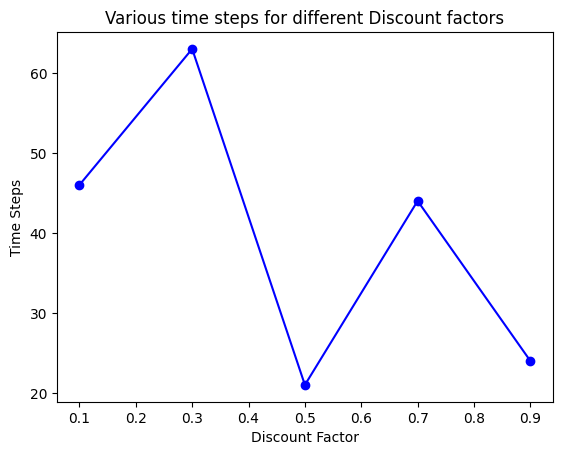

In [47]:
# Plot each Discount factor against the time steps
plt.plot(discount_factor, results, marker='o', color='b')

# Labels
plt.xlabel('Discount Factor')
plt.ylabel('Time Steps')

# Title
plt.title("Various time steps for different Discount factors")

plt.show()


From the above, the best discount factor is 0.9


In [48]:
best_discount_factor = 0.9


#### Epsilon

The agent will be trained with the specified values for the Epsilon parameter to find the value with the least time steps


In [49]:
# Epsilon values
epsilon = [0.1, 0.3, 0.5, 0.7, 0.9]
results = []
test_epoch = 10

for eps in epsilon:
    # Initialize Q-learning agent
    agent = QLearningAgent(env, learning_rate=best_learning_rate, discount_factor=best_discount_factor, epsilon=eps)
    print(f'Training for Epsilon {eps}')
    agent.train(num_episodes=10000)
    steps = agent.test(num_episodes=test_epoch, hyperparameter=True)
    results.append(steps/test_epoch)

results

Training for Epsilon 0.1
Training complete for 10000 steps with the highest reward of 76 and average reward of 27.0982 and average timestep of 23.5888.
Training for Epsilon 0.3
Training complete for 10000 steps with the highest reward of 76 and average reward of -1.2361 and average timestep of 23.8071.
Training for Epsilon 0.5
Training complete for 10000 steps with the highest reward of 76 and average reward of -19.9279 and average timestep of 20.9939.
Training for Epsilon 0.7
Training complete for 10000 steps with the highest reward of 76 and average reward of -24.9871 and average timestep of 18.1771.
Training for Epsilon 0.9
Training complete for 10000 steps with the highest reward of 76 and average reward of -24.4858 and average timestep of 14.9478.


[24.0, 24.0, 24.0, 24.0, 24.0]


From the above, epsilon 0.1 appears to be the best.
Other epsilon values may have found a path but because they have negative rewards, we're uncertain.
Epsilon 0.1 has a very high average positive reward that proves that it was able to find and learn a path.


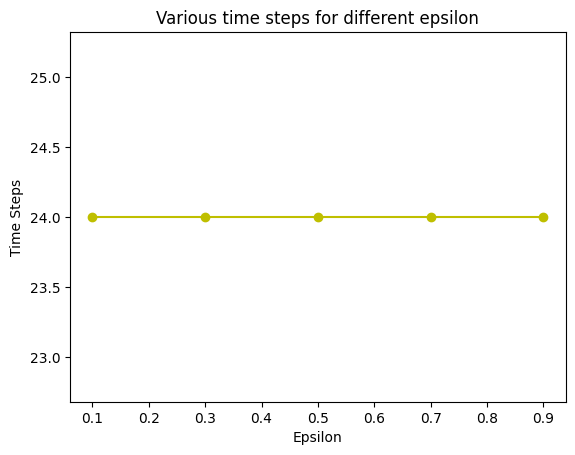

In [50]:
# Plot each epsilon against the time steps
plt.plot(epsilon, results, marker='o', color='y')

# Labels
plt.xlabel('Epsilon')
plt.ylabel('Time Steps')

# Title
plt.title("Various time steps for different epsilon")

plt.show()


The best epsilon is 0.1


In [51]:
best_epsilon = 0.1


#### Initialize the agent with the best hyperparameter values


In [52]:
# Initialize Q-learning agent
agent = QLearningAgent(env, learning_rate=best_learning_rate, discount_factor=best_discount_factor, epsilon=best_epsilon)


#### Train the agent

Train the agent with the best hyperparameter values


In [53]:
# Train the agent for 10000 episodes for the best result
agent.train(num_episodes=10000, display=True)

Episode 9900, Total Reward: 76.
Training complete for 10000 steps with the highest reward of 76 and average reward of 35.84 and average timestep of 24.538.



#### Evaluate the agent

Test the agent with the best hyperparameter values


In [54]:
#Test the agent's performance. No more exploration, only exploitation
best_rl_penalties, best_rl_total_reward, best_rl_timesteps, best_rl_epoch = agent.test(num_episodes=100)

# render the custom environment
env.render()

Current Node: 2742529, Latitude: 54.5675608, Longitude: -1.262172
Visited Nodes: [12290644708, 1817945870, 255404702, 9815513286, 3107441422, 1817945942, 7631102, 21477577, 21477568, 21477564, 21477540, 21477527, 414083608, 21477353, 7652369, 27698869, 27698859, 7652371, 7652373, 4545223289, 817174317, 27725106, 580910344, 583502147, 2742529]


In [55]:
# Compute the results
print(f'Agent results after {rl_epoch} episodes')
print(f'Average time steps per episode {rl_timesteps/rl_epoch}')
print(f'Average penalties per episode {rl_penalties/rl_epoch}')
print(f'Agent rewards per episode {rl_total_reward/rl_epoch}')

Agent results after 100 episodes
Average time steps per episode 24.0
Average penalties per episode 0.0
Agent rewards per episode 76.0


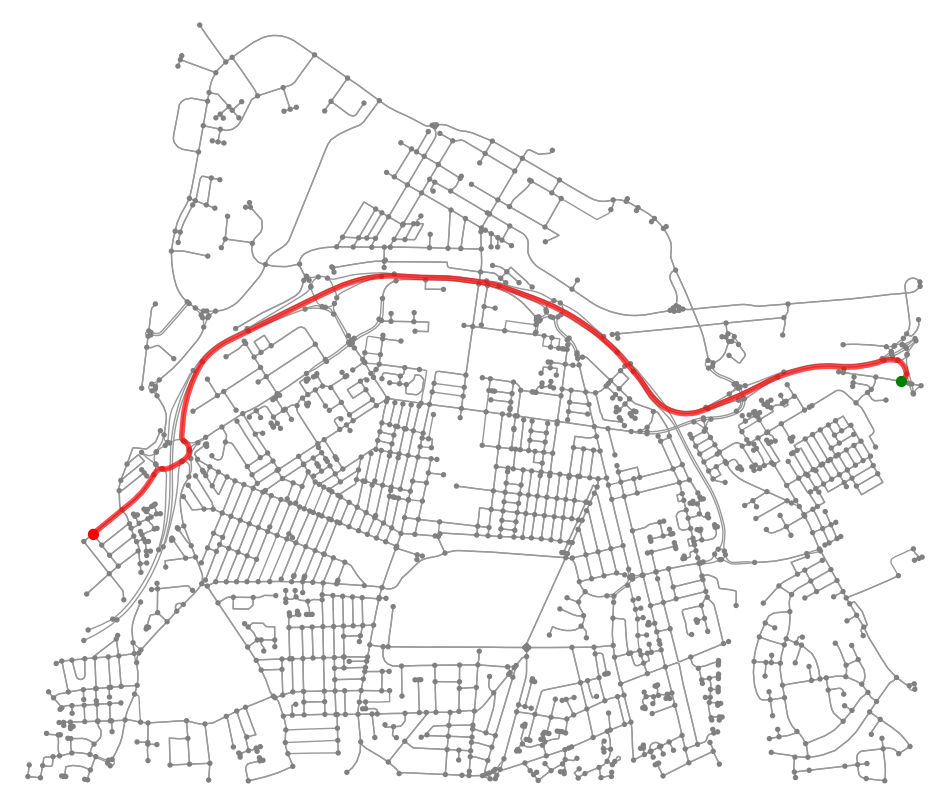

In [56]:
# Plot the agents best learned route with the best hyperparameter values
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='#ffffff', node_color='grey', figsize=(12, 12))
ox.plot_graph_route(G, route=env.visited_nodes, route_linewidth=4, route_color='red', route_alpha=0.7, orig_dest_size=50, ax=ax, show=False, close=False)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[origin[0]], node_color='green', node_size=50, ax=ax)
nx.draw_networkx_nodes(G, pos=ox.graph_to_gdfs(G, nodes=True, edges=False).geometry.map(lambda x: (x.x, x.y)), nodelist=[destination[0]], node_color='red', node_size=50, ax=ax)
plt.show()

In [57]:
rlagent_visited_nodes = env.visited_nodes
rlagent_distance = compute_weight(G, rlagent_visited_nodes, 'length')
rlagent_time = compute_weight(G, rlagent_visited_nodes, 'travel_time')
print(f'The distance for RL agent is {rlagent_distance:.2f} meters, which is {(rlagent_distance/1000):.2f} km')
print(f'The travel time for RL agent is {rlagent_time:.2f} seconds, which is {(rlagent_time/60):.2f} minutes')

The distance for RL agent is 4818.40 meters, which is 4.82 km
The travel time for RL agent is 239.79 seconds, which is 4.00 minutes



# Traffic and Road Closures

The agent can adapt in real time to real-world scenarios, such as traffic congestion and road blockades, to dynamically reroute and continue toward the goal if there are other paths.
There are no free sources for real-time traffic information, and even if there were, making API calls would be too computationally expensive, given that the reinforcement learning agent is trained for a large number of episodes. However, a mechanism is used to simulate this by randomly selecting nodes to represent traffic or road closure issues.


In [58]:
# Initialize a new environment
env = MiddlesbroughEnv(G, origin[0], destination[0], traffic=True, closure=True)

# render the environment
env.render()

Current Node: 12290644708, Latitude: 54.5739794, Longitude: -1.2035017
Visited Nodes: [12290644708]


Closed road: [414083608]
Traffic congestion: [709985083]


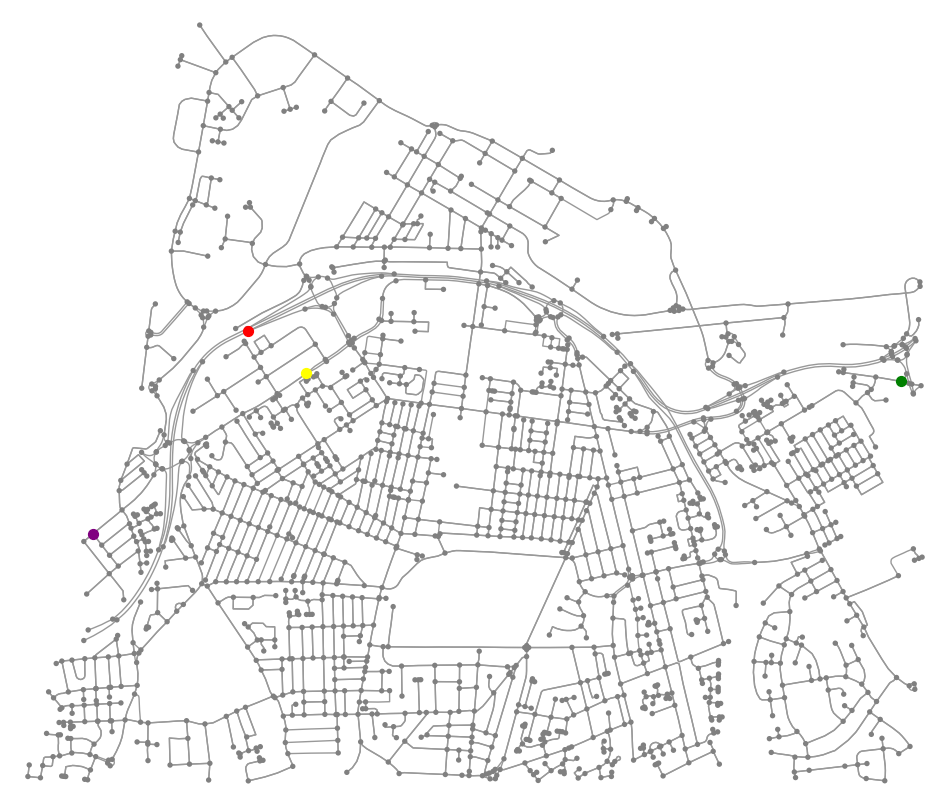

In [59]:
if env.traffic is True or env.closure is True:
    # Red dot represent closed roads
    # Yellow dot represent traffic congestion
    # Green and Purple dots are origin and destination respectively
    print(f'Closed road: {env.closure_nodes}')
    print(f'Traffic congestion: {env.traffic_nodes}')
    show_plots(t=env.traffic_nodes, c=env.closure_nodes, o=[origin[0]], d=[destination[0]])

In [60]:
# Initialize Q-learning agent with the best hyperparameter values
agent = QLearningAgent(env, learning_rate=best_learning_rate, discount_factor=best_discount_factor, epsilon=best_epsilon)


## Train the agent


In [61]:
# Train the agent for 100000 episodes for the best result
agent.train(num_episodes=100000, display=True)

Episode 99900, Total Reward: 56.
Training complete for 100000 steps with the highest reward of 65 and average reward of -23.74218 and average timestep of 30.96288.



## Evaluate the agent


In [62]:
#Test the agent's performance. No more exploration, only exploitation
rl_penalties, rl_total_reward, rl_timesteps, rl_epoch = agent.test(num_episodes=10)

# render the custom environment
env.render()

Current Node: 2742529, Latitude: 54.5675608, Longitude: -1.262172
Visited Nodes: [12290644708, 1817945870, 255404702, 9815513286, 3107441422, 1817945942, 7631102, 27724530, 833956663, 833956618, 21477577, 21477568, 21477564, 738242722, 21477507, 27699253, 7638289, 27724522, 7654900, 21477540, 21477527, 21477327, 21477330, 709985071, 34053547, 709985079, 11664854318, 710020237, 541412878, 544036876, 544036870, 294772617, 7654965, 7654949, 1744566770, 421469571, 421469582, 292262347, 7652373, 4545223289, 817174317, 27725106, 580910344, 583502147, 2742529]


In [63]:
# Compute the results
print(f'Agent results after {rl_epoch} episodes')
print(f'Average time steps per episode {rl_timesteps/rl_epoch}')
print(f'Average penalties per episode {rl_penalties/rl_epoch}')
print(f'Agent rewards per episode {rl_total_reward/rl_epoch}')

Agent results after 10 episodes
Average time steps per episode 44.0
Average penalties per episode 0.0
Agent rewards per episode 56.0


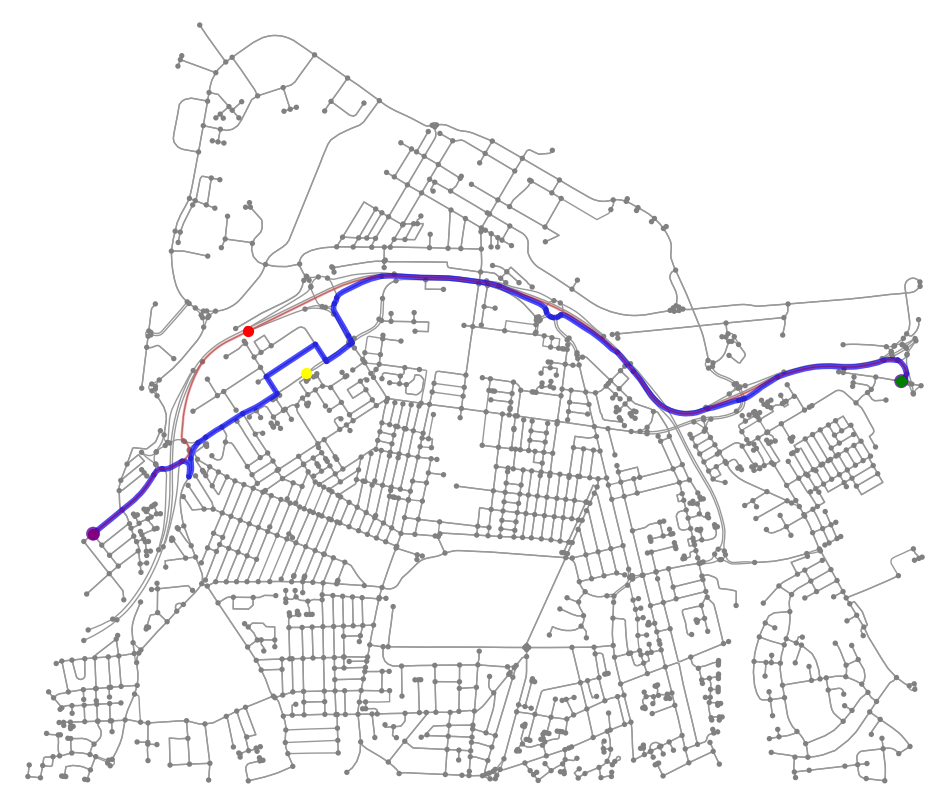

In [64]:
# Plot the agents best learned route and show the traffic and closed roads
show_plots(r=env.visited_nodes, t=env.traffic_nodes, c=env.closure_nodes, o=[origin[0]], d=[destination[0]], default=rlagent_visited_nodes)


The image above shows that the agent can learn an alternative route to bypass both traffic congestion and road closures.  
The agent prioritizes avoiding road closures over traffic congestion because in reality, closure nodes represent dead ends, meaning no further routes are available beyond them, whereas traffic congestion may eventually clear up.  
The agent may go through a traffic node if it is the only path to the goal but would never go through a closure node if that is the only path to the goal. In reality, going through a traffic node could indicate that the traffic congestion has cleared.  
The green dot represents the start node.  
The purple dot represents the end node.  
The red dot indicates a closed road.  
The yellow dot indicates traffic congestion.  
The blue line shows the agent's best-learned route after bypassing closed roads or traffic congestion.  
The thin red line represents the default route if the road were not closed.  


In [65]:
rlagent_simulation = env.visited_nodes
rlagent_sim_distance = compute_weight(G, rlagent_simulation, 'length')
rlagent_sim_time = compute_weight(G, rlagent_simulation, 'travel_time')
print(f'The distance for RL agent with traffic and road closure simulation is {rlagent_sim_distance:.2f} meters, which is {rlagent_sim_distance/1000:.2f} km')
print(f'The travel time for RL agent with traffic and road closure is {rlagent_sim_time:.2f} seconds, which is {rlagent_sim_time/60:.2f} minutes')

The distance for RL agent with traffic and road closure simulation is 5187.01 meters, which is 5.19 km
The travel time for RL agent with traffic and road closure is 313.36 seconds, which is 5.22 minutes



# Evaluate Results


In [66]:
# function to compute the average speed
def compute_average_speed(d, t):
    speed_ms = []
    speed_kmh = []
    for dist, time in zip(d, t):
        speed_ms.append((dist/time))
        speed_kmh.append((dist/time)*3.6)
    return speed_ms, speed_kmh

def compute_distance_in_km(d):
    distance_km = []
    for dist in d:
        distance_km.append(dist/1000)
    return distance_km

def compute_time_in_minutes(t):
    time_m = []
    for time in t:
        time_m.append(time/60)
    return time_m

# Compute values to plot
google_distance = google_routes[0]['legs'][0]['distance']['value']
google_time = google_routes[0]['legs'][0]['duration']['value']
osm_distance = osm_routes['routes'][0]['distance']
osm_time = osm_routes['routes'][0]['duration']

#methods = ['Dijkstra by distance', 'Dijkstra by travel time', 'A* with Geodesic distance heuristic', 'A* with Haversine distance heuristic', 'Reinforcement Learning agent', 'Reinforcement Learning agent with simulation', 'Google Map', 'Open Street Map']
methods = ['Dijkstra by distance', 'Dijkstra by travel time', 'A* with Geodesic distance heuristic', 'A* with Haversine distance heuristic', 'Reinforcement Learning agent', 'Reinforcement Learning agent with simulation']
#distance = [route_distance, tt_distance, awt_distance, awd_distance, rlagent_distance, rlagent_sim_distance, google_distance, osm_distance]
distance = [route_distance, tt_distance, awt_distance, awd_distance, rlagent_distance, rlagent_sim_distance]
distance_in_km = compute_distance_in_km(distance)
#time = [rl_travel_time, route_time, awt_travel_time, awd_travel_time, rlagent_time, rlagent_sim_time, google_time, osm_time]
time = [rl_travel_time, route_time, awt_travel_time, awd_travel_time, rlagent_time, rlagent_sim_time]
time_in_m = compute_time_in_minutes(time)
speed_in_ms, speed_in_kmh = compute_average_speed(distance, time)

results = list(zip(methods, distance, distance_in_km, time, time_in_m, speed_in_ms, speed_in_kmh))
df = pd.DataFrame(results, columns = ['Optimal Path Algorithm', 'Distance(m)', 'Distance(km)', 'Time(s)', 'Time(m)', 'Average Speed(m/s)', 'Average Speed(km/h)'])
df['Distance(m)'] = df['Distance(m)'].round(2)
df['Distance(km)'] = df['Distance(km)'].round(2)
df['Time(s)'] = df['Time(s)'].round(2)
df['Time(m)'] = df['Time(m)'].round(2)
df['Average Speed(m/s)'] = df['Average Speed(m/s)'].round(2)
df['Average Speed(km/h)'] = df['Average Speed(km/h)'].round(2)
df

,Optimal Path Algorithm,Distance(m),Distance(km),Time(s),Time(m),Average Speed(m/s),Average Speed(km/h)
0,Dijkstra by distance,4472.93,4.47,313.04,5.22,14.29,51.44
1,Dijkstra by travel time,4818.40,4.82,239.79,4.00,20.09,72.34
2,A* with Geodesic distance heuristic,4818.40,4.82,239.79,4.00,20.09,72.34
3,A* with Haversine distance heuristic,4818.40,4.82,239.79,4.00,20.09,72.34
4,Reinforcement Learning agent,4818.40,4.82,239.79,4.00,20.09,72.34
5,Reinforcement Learning agent with simulation,5187.01,5.19,313.36,5.22,16.55,59.59


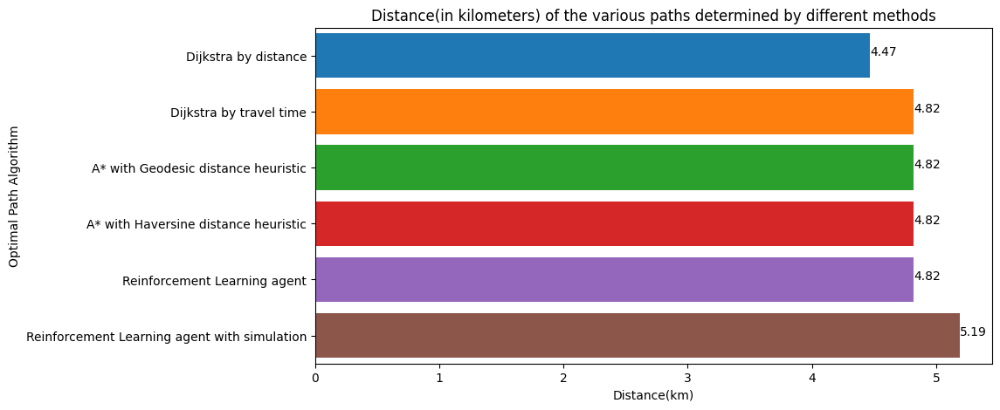

In [67]:
# Plot methods against distance in Kilometer
plt.figure(figsize=(10,5))
sns.barplot(data=df,
            x='Distance(km)',
            y='Optimal Path Algorithm',
            order=df.sort_values(by='Distance(km)')['Optimal Path Algorithm'],
            saturation = 1,
            palette = 'tab10')
for id, value in enumerate(df.sort_values(by='Distance(km)')['Distance(km)']):
    plt.text(value, id, str(value))
plt.title('Distance(in kilometers) of the various paths determined by different methods')
plt.show()

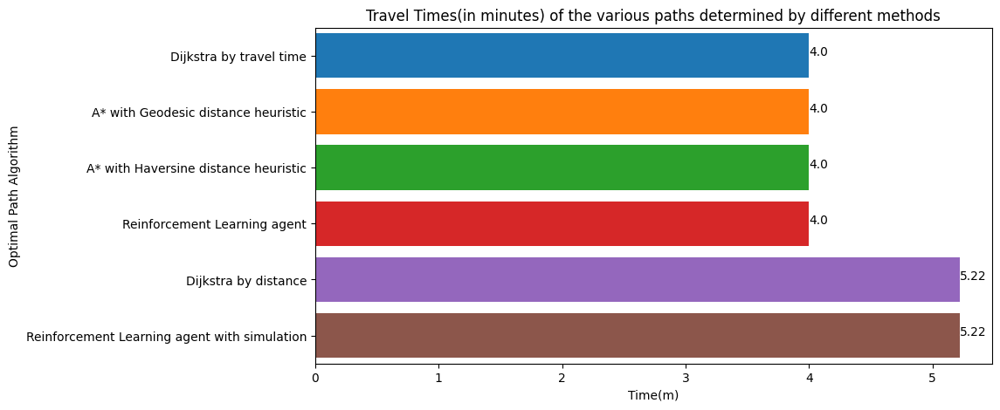

In [68]:
# Plot methods against travel time in minutes
plt.figure(figsize=(10,5))
sns.barplot(data=df,
            x='Time(m)',
            y='Optimal Path Algorithm',
            order=df.sort_values(by='Time(m)')['Optimal Path Algorithm'],
            saturation = 1,
            palette = 'tab10')
for id, value in enumerate(df.sort_values(by='Time(m)')['Time(m)']):
    plt.text(value, id, str(value))
plt.title('Travel Times(in minutes) of the various paths determined by different methods')
plt.show()


# Summary


The reinforcement learning agent explores blindly and may never find a path within the specified number of episodes. 
Even if it does find a path, it may take a very long time or may not be anywhere near optimal.
On the other hand, Dijkstra's search algorithm can find the shortest path, but it is static and does not consider real-time traffic or road closures.  
To address these limitations, future work will focus on combining both approaches.  

Using travel time as the true cost of traversing a road, Dijkstra can compute and plan the shortest path.  
Reinforcement learning can then follow or learn that path, taking into account any traffic or road issues.  
If traffic or a road closure is encountered, the agent reroutes to bypass the affected path and find an alternative route to reconnect with the remaining nodes.  
This hybrid approach will be valuable for both path planning and learning.  
